In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict, Counter

In [2]:
import pickle

In [3]:
from typing import List, Dict, Any, Tuple

In [4]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [5]:
import colorcet

In [6]:
import glob
from tqdm.notebook import tqdm
import json

In [7]:
from bertopic import BERTopic

In [8]:
# Set up LaTeX fonts
#plt.style.use(['no-latex'])
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['text.usetex'] = True
#plt.rcParams['text.latex.unicode'] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Liberation Sans', 'Bitstream Vera Sans', 'sans-serif']

In [16]:
# read embedding dict from disk
embedding_file = "../data/doc_summary_embedding_dict.pkl"

with open(embedding_file, "rb") as file:
    doc2embedding: Dict[str, Dict] = pickle.load(file)

In [17]:
embeddings: np.array = np.array(
    [
        emb for emb in doc2embedding.values()
    ]
)

In [18]:
document_indexes: List[str] = [
    emb for emb in doc2embedding.keys()
]

In [40]:
# read articles from from yaml files
text_path = '../data/json_files/' 

# get all files in the path 
json_files: List[str] = glob.glob(text_path + '*.json')

doc_titles_dict: Dict[str, str] = defaultdict()
doc_topics_dict: Dict[str, List[str]] = defaultdict(list)

# read all json files
for file in json_files:
    with open(file, 'r') as f:
        article_json = json.load(f)

        doc_ID = file.split('/')[-1].split('.')[0]

        doc_titles_dict[doc_ID] = article_json['revised_title']

        doc_topics_dict[doc_ID] = ' '.join(article_json['semantic_tags'])

In [41]:
doc_titles = [doc_titles_dict[i] for i in doc2embedding]
doc_topics = [doc_topics_dict[i] for i in doc2embedding]

In [20]:
tsne = TSNE(n_components=2, perplexity=100, random_state=42, verbose=True)

tsne_embeddings = tsne.fit_transform(embeddings)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 47558 samples in 0.006s...
[t-SNE] Computed neighbors for 47558 samples in 20.053s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47558
[t-SNE] Computed conditional probabilities for sample 2000 / 47558
[t-SNE] Computed conditional probabilities for sample 3000 / 47558
[t-SNE] Computed conditional probabilities for sample 4000 / 47558
[t-SNE] Computed conditional probabilities for sample 5000 / 47558
[t-SNE] Computed conditional probabilities for sample 6000 / 47558
[t-SNE] Computed conditional probabilities for sample 7000 / 47558
[t-SNE] Computed conditional probabilities for sample 8000 / 47558
[t-SNE] Computed conditional probabilities for sample 9000 / 47558
[t-SNE] Computed conditional probabilities for sample 10000 / 47558
[t-SNE] Computed conditional probabilities for sample 11000 / 47558
[t-SNE] Computed conditional probabilities for sample 12000 / 47558
[t-SNE] Computed conditional probabilities for s

In [25]:
# metadata_df = pd.read_csv('data/outputs/rsc_metadata_full.csv')
# metadata_df.head()

In [26]:
# get document titles from metadata

# document_titles: List[str] = []

# # TODO: this is very slow, should be optimized
# for doc_index in tqdm(document_indexes):
#     document_titles.append(
#         metadata_df.loc[
#             metadata_df['id'] == doc_index
#         ]['title'].values[0]
#     )



In [27]:
# document_titles_2 = [
#     str(document_indexes[i]) + ' ' + title  for i, title in enumerate(document_titles)
# ]

In [28]:
topic_model = BERTopic(
    verbose=True,
    min_topic_size=25,
    #nr_topics=100,
    calculate_probabilities=True,
    #n_gram_range=(1,2),
    #nr_topics="auto",
)

In [45]:
topics, probs = topic_model.fit_transform(
    doc_topics, 
    embeddings,
)

2024-11-14 15:19:44,087 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-14 15:20:41,278 - BERTopic - Dimensionality - Completed ✓
2024-11-14 15:20:41,279 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-11-14 15:23:15,917 - BERTopic - Cluster - Completed ✓
2024-11-14 15:23:15,934 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-11-14 15:23:16,506 - BERTopic - Representation - Completed ✓


In [47]:
# Reduce outliers
topics = topic_model.reduce_outliers(doc_topics, topics)
topic_model.update_topics(doc_titles, topics=topics)

topic_set = set(topics)

color_set = sns.color_palette(
    colorcet.glasbey,
    n_colors=len(topic_set)
)

topic2color = {
    topic: color
    for topic, color in zip(topic_set, color_set)
}

topic2color[-1] = (0.6, 0.6, 0.6)

topic_names = topic_model.get_topic_info()['Name'].values

# topic2name = {
#     int(t_name[:t_name.find('_')]): t_name
#     for t_name in topic_names
# }

100%|██████████| 20/20 [00:01<00:00, 11.02it/s]
2024-11-14 15:25:47,319 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [49]:
# for d, s, t, p in zip(document_indexes, summaries, topics, probs):
#     print(f"Id: {d}")
#     print(f"Summary: {s}")
#     print(f"Topic: {t}")
#     print(f"Probabilities: {p}")

In [48]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1,-1_bicoeca_reexamination_classification_species,"[bicoeca, reexamination, classification, speci...",[Gas analysis Carbon dioxide measurement Atmos...
1,0,866,0_flow_fluid_viscous_boundary,"[flow, fluid, viscous, boundary, vortex, flows...",[Fluid Dynamics Pipe Flow Laminar Flow Boundar...
2,1,773,1_relativity_gravitational_general_quantum,"[relativity, gravitational, general, quantum, ...",[Black Holes Gravitational Waves Perturbation ...
3,2,565,2_magnetic_magnetism_terrestrial_declination,"[magnetic, magnetism, terrestrial, declination...",[Geomagnetism Surveying Terrestrial magnetism ...
4,3,529,3_continental_mantle_crust_tectonic,"[continental, mantle, crust, tectonic, rocks, ...",[Geology Continental crust formation Isotope d...
...,...,...,...,...,...
320,319,64,319_microbial_bacteria_sulphur_microbiology,"[microbial, bacteria, sulphur, microbiology, n...",[Microbiology Nitrification Microorganisms Fer...
321,320,94,320_dioxide_assimilation_carbon_plants,"[dioxide, assimilation, carbon, plants, leaves...",[Photosynthesis Plant Physiology Diurnal Rhyth...
322,321,87,321_spectrometry_mass_ion_ionization,"[spectrometry, mass, ion, ionization, kinetic,...",[Mass spectrometry Ion fragmentation Peak shap...
323,322,68,322_cultivation_fruit_tree_trees,"[cultivation, fruit, tree, trees, seed, mallin...",[Horticulture Plant propagation Fruit trees Gr...


In [49]:
hierarchical_topics = topic_model.hierarchical_topics(doc_titles)

100%|██████████| 323/323 [00:01<00:00, 179.32it/s]


In [50]:
# article_titles = [
#     doc2json[doc]["article_id"] + ': ' + doc2json[doc]["revised_title"] + '. Keyterms: ' + ', '.join(doc2json[doc]["topics"])
#     for doc in document_indexes
# ]

topic_model.visualize_documents(doc_titles, reduced_embeddings=tsne_embeddings)

In [51]:
topic_model.get_document_info(doc_titles)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Investigation of Specific Heats in Ferromagnet...,233,233_thermal_conductivity_heat_conduction,"[thermal, conductivity, heat, conduction, cond...",[Thermal Conductivity Heat Transfer Water Prop...,thermal - conductivity - heat - conduction - c...,0.020254,False
1,Atmospheric Oscillations and Temperature Varia...,204,204_tidal_oceans_tides_laplaces,"[tidal, oceans, tides, laplaces, oscillations,...",[Oceanography Tides Fluid Dynamics Geophysics ...,tidal - oceans - tides - laplaces - oscillatio...,0.011014,False
2,Magnetisation Direction in Ferromagnetic Singl...,165,165_resonance_paramagnetic_rareearth_nuclear,"[resonance, paramagnetic, rareearth, nuclear, ...",[Crystallography Rare Earths Paramagnetic Reso...,resonance - paramagnetic - rareearth - nuclear...,0.012887,False
3,Magnetic Declination Phenomena at Kew Observat...,2,2_magnetic_magnetism_terrestrial_declination,"[magnetic, magnetism, terrestrial, declination...",[Geomagnetism Surveying Terrestrial magnetism ...,magnetic - magnetism - terrestrial - declinati...,0.328569,False
4,Gauge-Invariant Hamiltonian for Molecular Inte...,1,1_relativity_gravitational_general_quantum,"[relativity, gravitational, general, quantum, ...",[Black Holes Gravitational Waves Perturbation ...,relativity - gravitational - general - quantum...,0.375196,False
...,...,...,...,...,...,...,...,...
47553,Revisiting the Dynamics of Superfluids and Che...,137,137_superconductors_superconducting_supercondu...,"[superconductors, superconducting, superconduc...",[Superconductivity Thermodynamics Elasticity P...,superconductors - superconducting - supercondu...,0.043389,False
47554,Marine Science Progress and Needs Discussion,32,32_ocean_north_sea_shelf,"[ocean, north, sea, shelf, geochemical, fronts...",[Oceanography Tidal dynamics Mixing fronts Nor...,ocean - north - sea - shelf - geochemical - fr...,0.013159,False
47555,Comparing the Buffering Powers and Equivalent ...,276,276_power_magnetohydrodynamic_generation_heavy,"[power, magnetohydrodynamic, generation, heavy...",[Magnetohydrodynamics Power generation Potassi...,power - magnetohydrodynamic - generation - hea...,0.054499,False
47556,Dynamics of Wing Beat in Drosophila Melanogaster,284,284_flight_hovering_wing_insect,"[flight, hovering, wing, insect, kinematics, a...",[Aerodynamics Flight Mechanics Bird Flight Fla...,flight - hovering - wing - insect - kinematics...,1.000000,False


In [56]:
topic_model.visualize_heatmap()

In [55]:
#print(topic_model.get_topic_tree(hierarchical_topics))

In [57]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [58]:
topic_model.visualize_barchart(top_n_topics=325, n_words=10)

In [48]:
#topic2label

In [30]:
topic2label = {
    int(t_lable.split()[0]): ', '.join(t_lable.split()[0:])
    for t_lable in topic_model.generate_topic_labels(
        nr_words=20, 
        separator=" "
    )
}

topic2label

{0: '0, astronomy, celestial, celestial, mechanics, astronomical, telescopes, eclipse, mechanics, observations, solar, observational',
 1: '1, magnetic, magnetism, magnetism, magnetic, declination, magnetic, observations, magnetic, declination, iron, magnetic, properties, terrestrial, terrestrial, magnetism',
 2: '2, electrical, electricity, electromagnetic, discharge, electric, electrostatics, electromagnetism, induction, conductivity, force',
 3: '3, fish, marine, biology, marine, biology, fish, anatomy, anatomy, zoology, development, ichthyology, reproduction',
 4: '4, chemistry, compounds, organic, chemical, organic, chemistry, reactions, acid, chemical, reactions, inorganic, inorganic, chemistry',
 5: '5, heat, thermal, heat, transfer, transfer, thermodynamics, radiation, thermal, conductivity, molecular, specific, heat, gas',
 6: '6, geology, mineralogy, volcanology, water, mining, mineral, salt, springs, volcanology, geology, geochemistry',
 7: '7, plant, botany, plant, anatomy,

In [31]:
def get_category_centroids(
        embeddings_2D: np.array, # 2D tsne embeddings
        category_list: List[str]           # list of categories
    ) -> Dict[str, np.array]:    # return dict of category centroids

    cateogry_embeddings = defaultdict(list)

    for cat, tsne_emb in zip(category_list, embeddings_2D):
        cateogry_embeddings[cat].append(tsne_emb)

    category_centroids = {}

    for cat, embeddings in cateogry_embeddings.items():
        centroid = np.median(embeddings, axis=0)
        category_centroids[cat] = centroid

    return category_centroids

In [32]:
def plot_embedding_2D(
        embeddings_2D: np.array, # 2D tsne embeddings
        category_list: List[str],          # list of categories 
        with_captions: bool = True         # show category captions  
    ) -> None:                             # show plot, return None  


    colors: Dict[str, str] = [
        topic2color[cat] for cat in category_list
    ]
    
    # Create a scatter plot to visualize the t-SNE embeddings
    plt.figure(figsize=(12, 12))

    scatter = plt.scatter(
        embeddings_2D[:, 0], 
        embeddings_2D[:, 1], 
        alpha=0.25, 
        c=colors,
        marker='o',
        s=18
    )

    category_centroids = get_category_centroids(
        embeddings_2D, 
        category_list
    )


    handles = [
        plt.Line2D(
            [],
            [],
            marker='o',
            color=topic2color[cat], 
            linestyle='', 
            markersize=8,
            label=topic2label[cat]
        ) for cat in sorted(list(category_centroids.keys())) 
        if cat != 'Other'
    ]

    if with_captions:

        for cat, centroid in category_centroids.items():

            if cat == "Other":
                continue

            #rand_int = random.randint(-5, 5)

            plt.text(
                centroid[0], #- 15, 
                centroid[1], #- rand_int, 
                cat, #r"${{{}}}$".format(category2text[cat]), 
                fontdict=dict(fontsize=24, fontweight='normal', color='black'), 
                bbox=dict(
                    facecolor=topic2color[cat], 
                    alpha=0.5, 
                    linewidth=0, 
                    boxstyle='round,pad=0.1'
                    )
                )

    plt.legend(
        handles=handles, 
        title="", 
        fontsize=18, 
        framealpha=0,
        #loc='lower center',
        loc='upper left', 
        #bbox_to_anchor=(0.5, -0.25), 
        bbox_to_anchor=(1, 1), 
        #ncols=3,
        ncols=1,
    )


    plt.title('t-SNE projections', fontsize=16)
    #plt.xlabel('t-SNE Dimension 1')
    #plt.ylabel('t-SNE Dimension 2')
    #plt.ylim(-100, 100)
    #plt.xlim(-110, 110)

    plt.show()    

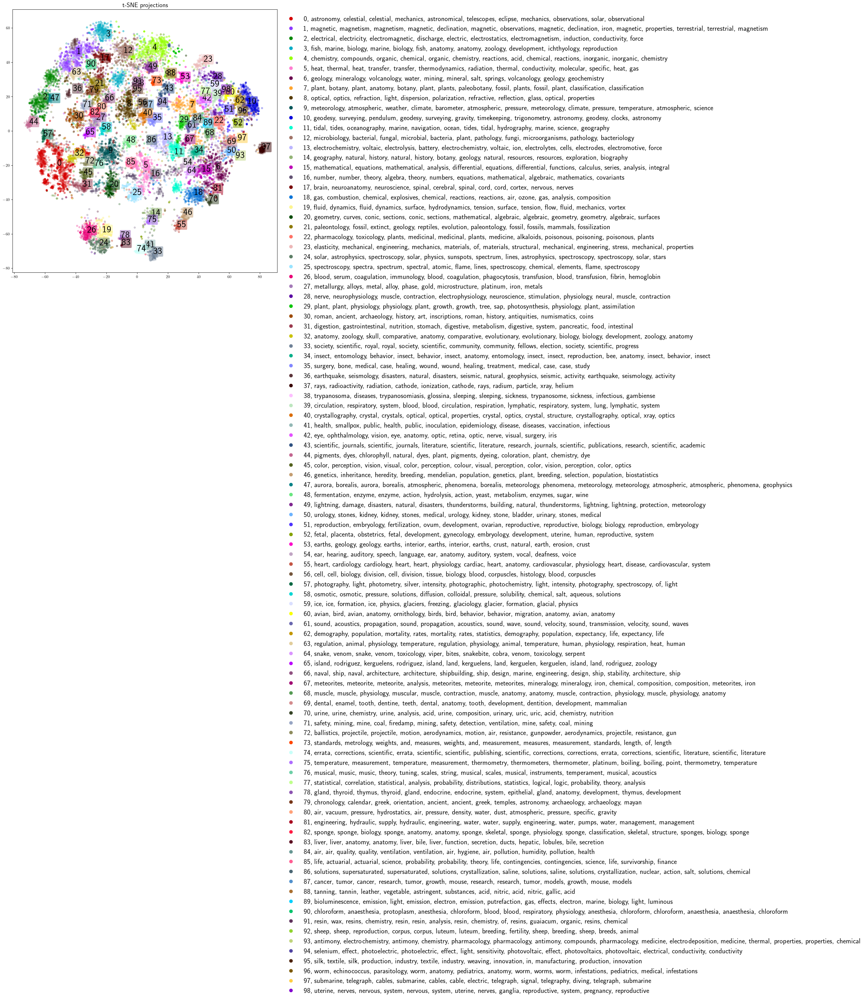

In [59]:
plot_embedding_2D(tsne_embeddings, topics, with_captions=True)

In [53]:

# read the metadat file into a pandas dataframe
metadata_file = '../data/Royal_Society_Corpus_open_v6.0_meta.tsv'

metadata_df = pd.read_csv(metadata_file, delimiter='\t')

metadata_df.head()

,id,issn,title,fpage,lpage,year,volume,journal,author,type,...,tokens,visualizationLink,doi,jstorLink,hasAbstract,isAbstractOf,primaryTopic,primaryTopicPercentage,secondaryTopic,secondaryTopicPercentage
0,rspa_1905_0001,0950-1207,"Address delivered by the President, Sir Willia...",1,29,1905,76,Proceedings of the Royal Society of London. Se...,"Sir William Huggins K. C. B., O. M., F. R. S.",speech,...,14279,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0001,NaN,NaN,NaN,Biography,87.018807,Immunology,3.397728
1,rspa_1905_0002,0950-1207,"The boring of the Simplon Tunnel, and the dist...",29,33,1905,76,Proceedings of the Royal Society of London. Se...,"Francis Fox, M. Inst. C. E. |C. V. Boys, F. R. S.",article,...,1816,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0002,NaN,NaN,NaN,Geography,34.843817,Thermodynamics,26.224835
2,rspa_1905_0003,0950-1207,On a method of finding the conductivity for heat.,34,48,1905,76,Proceedings of the Royal Society of London. Se...,"Professor C. Niven, F. R. S.",article,...,3624,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0003,NaN,NaN,NaN,Electricity,22.229782,Formulae,19.054271
3,rspa_1905_0004,0950-1207,Theory of the reflection of light near the pol...,49,65,1905,76,Proceedings of the Royal Society of London. Se...,"Richard C. Maclaurin, M. A., LL. D.|Professor ...",article,...,2722,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0004,NaN,NaN,NaN,Tables,38.543461,Fluid Dynamics,28.361855
4,rspa_1905_0005,0950-1207,On the relation between variations of atmosphe...,66,86,1905,76,Proceedings of the Royal Society of London. Se...,"Captain H. G. Lyons|Sir W. E. Garstin, G. C. M...",article,...,10079,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0005,NaN,NaN,NaN,Meteorology,51.203697,Geography,22.031809


In [59]:
# add year, decade, and period to the dictionaries in doc2json

for doc in tqdm(doc2json):
    df_row = metadata_df.loc[metadata_df['id'] == doc]
    year = df_row['year'].values[0]
    decade = df_row['decade'].values[0]
    period = df_row['period'].values[0]

    doc2json[doc]['year'] = year
    doc2json[doc]['decade'] = decade
    doc2json[doc]['period'] = period

  0%|          | 0/17486 [00:00<?, ?it/s]

100%|██████████| 17486/17486 [00:13<00:00, 1287.74it/s]


In [67]:
decades = [
    doc2json[doc]['decade'] for doc in document_indexes
]

In [68]:

topics_over_time = topic_model.topics_over_time(topic_sentences, decades)

topic_model.visualize_topics_over_time(topics_over_time, topics=[15, 40, 42, 62])

0it [00:00, ?it/s]

27it [00:01, 19.97it/s]
